### Demo-01

Part A: Data ingestion pipeline (Azure Portal).

MS Buildings Dataset:
Open building footprints around the world, over 999 million buildings from Bing Maps imagery.

![alternative text](images/demo-01-ingest.png)

Storage account containers

![alternative text](images/demo-01-storage-containers.png)

Part B: Transform & Load steps below (Notebook).

### Imports

In [67]:
import pystac_client
import planetary_computer
import geopandas as gpd
import pandas as pd
import contextily

In [68]:
import rasterio.features
import numpy as np
import xarray as xr
import stackstac
import xrspatial.multispectral as ms

import matplotlib.pyplot as plt

from shapely.geometry import Polygon

In [69]:
from azure.storage.blob import BlobServiceClient, BlobClient

#### Configure

In [70]:
storage_account = '<storage_account_name>'

#Valid for couple hrs only, Read + Write
SAS_token = '<Valid SAS for storage_account_name>' 

uri_SAS_input = 'abfs://raw/global/2022-07-06/ml-buildings.parquet/RegionName=Australia/quadkey=310320100/part-00041-98ab98f9-b939-442b-a7e2-c8cccce09842.c000.snappy.parquet'

storage_output_container = 'transformed'
storage_output_path = '/global/2022-07-06/ml-buildings.parquet/RegionName=Australia/quadkey=310320100/'

storage_options = {'account_name': storage_account, 'credential': SAS_token}

#### Read the dataset 
Datasets saved on Azure Storage

In [71]:
print(f'Reading data at {uri_SAS_input} location.')
msb_df = gpd.read_parquet(path=uri_SAS_input,storage_options=storage_options)
print('Data read successfully.')

Reading data at abfs://raw/global/2022-07-06/ml-buildings.parquet/RegionName=Australia/quadkey=310320100/part-00041-98ab98f9-b939-442b-a7e2-c8cccce09842.c000.snappy.parquet location.
Data read successfully.


#### Quadkeys

https://learn.microsoft.com/en-us/bingmaps/articles/bing-maps-tile-system#tile-coordinates-and-quadkeys

a.k.a Quadtree keys

Each quadkey uniquely identifies a single tile at a particular level of detail,alongwith latitude and longitude info.

- The length of a quadkey (the number of digits) equals the level of detail of the corresponding tile. 
- The quadkey of any tile starts with the quadkey of its parent tile (the containing tile at the previous level). 

As shown in the example below, tile 2 is the parent of tiles 20 through 23, and tile 13 is the parent of tiles 130 through 133:

![Quadkeys ](https://learn.microsoft.com/en-us/bingmaps/articles/media/5cff54de-5133-4369-8680-52d2723eb756.jpg)

In [72]:
msb_df.shape

(378604, 1)

In [73]:
msb_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 378604 entries, 0 to 378603
Data columns (total 1 columns):
 #   Column    Non-Null Count   Dtype   
---  ------    --------------   -----   
 0   geometry  378604 non-null  geometry
dtypes: geometry(1)
memory usage: 2.9 MB


In [74]:
msb_df.head()

,geometry
0,"POLYGON ((115.81535 -31.95164, 115.81544 -31.9..."
1,"POLYGON ((115.81199 -31.96260, 115.81199 -31.9..."
2,"POLYGON ((115.77462 -32.03227, 115.77442 -32.0..."
3,"POLYGON ((115.80907 -32.03373, 115.80907 -32.0..."
4,"POLYGON ((115.82143 -32.05835, 115.82128 -32.0..."


Plot the dataset

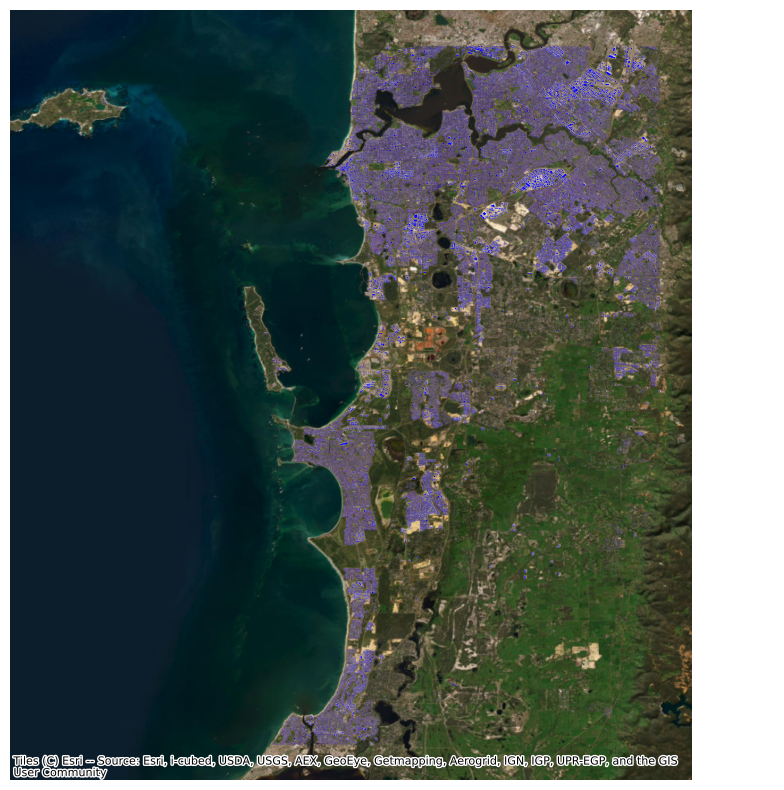

In [75]:
ax = (msb_df[['geometry']]).plot(figsize=(10, 10), color="blue")

contextily.add_basemap(
    ax,       
    source=contextily.providers.Esri.WorldImagery,    
    crs=(msb_df[['geometry']]).crs.to_string()    
)
ax.set_axis_off()

#### Process the dataset
Add calculations - e.g. Area

In [76]:
msb_df.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [77]:
msb_df.crs.axis_info[0].unit_name

'degree'

In [ ]:
# msb_df['geometry'].to_crs('EPSG:4326').area

Common EPSG Codes: EPSG Geodetic Parameter Dataset

https://en.wikipedia.org/wiki/EPSG_Geodetic_Parameter_Dataset

Common EPSG codes:

- EPSG:4326 - WGS 84, latitude/longitude coordinate system based on the Earth's center of mass, used by the Global Positioning System among others.
- EPSG:3857 - Web Mercator projection used for display by many web-based mapping tools, including Google Maps and OpenStreetMap.
- EPSG:7789 - International Terrestrial Reference Frame 2014 (ITRF2014), an Earth-fixed system that is independent of continental drift.

In [78]:
msb_df.to_crs('epsg:3857').crs.axis_info[0].unit_name

'metre'

In [79]:
msb_df['area_m2'] = msb_df['geometry'].to_crs('EPSG:3857').area

In [80]:
msb_df.head()

,geometry,area_m2
0,"POLYGON ((115.81535 -31.95164, 115.81544 -31.9...",212.547890
1,"POLYGON ((115.81199 -31.96260, 115.81199 -31.9...",320.545779
2,"POLYGON ((115.77462 -32.03227, 115.77442 -32.0...",439.554857
3,"POLYGON ((115.80907 -32.03373, 115.80907 -32.0...",288.940629
4,"POLYGON ((115.82143 -32.05835, 115.82128 -32.0...",438.511614


#### Save the dataset
Back on Azure Storage

In [81]:
uri_SAS_input

'abfs://raw/global/2022-07-06/ml-buildings.parquet/RegionName=Australia/quadkey=310320100/part-00041-98ab98f9-b939-442b-a7e2-c8cccce09842.c000.snappy.parquet'

In [82]:
local_file_name = uri_SAS_input.split('/')[len(uri_SAS_input.split('/'))-1]
local_file_name

'part-00041-98ab98f9-b939-442b-a7e2-c8cccce09842.c000.snappy.parquet'

In [83]:
local_directory = "./temp"
if not os.path.exists(local_directory):
    os.mkdir(local_directory)
    print('Directory created.')
else:
    print('Directory already exists.')

Directory already exists.


In [84]:
#Save locally
local_file_path = f'{local_directory}/{local_file_name}'
msb_df.to_parquet(path=local_file_path, compression='snappy') 
print(f'{local_file_name} saved locally.')

part-00041-98ab98f9-b939-442b-a7e2-c8cccce09842.c000.snappy.parquet saved locally.


In [85]:
#Upload to the storage

blob_service_client = BlobServiceClient(account_url=f"https://{storage_account}.blob.core.windows.net/", credential=SAS_token)

blob = blob_service_client.get_blob_client(container=storage_output_container + storage_output_path, blob=local_file_name)

with open(local_file_path, "rb") as data:
    blob.upload_blob(data = data, overwrite = True)
    print(f'Successfully uploaded {local_file_name} file to {storage_output_container} container.')

Successfully uploaded part-00041-98ab98f9-b939-442b-a7e2-c8cccce09842.c000.snappy.parquet file to transformed container.


#### Select area of interest
Subset of records

In [86]:
msb_df.shape

(378604, 2)

https://geojson.io/

In [87]:
#To get all rows which are within this polygon (Perth City)

# lon_point_list = [115.8101685,115.890003282467,115.890003282467,115.810168509256]
# lat_point_list = [-31.93917031, -31.9391703093098, -31.9719096339516, -31.9719096339516]

lon_point_list = [115.80922191913669,115.80922191913669, 115.89581467623259, 115.89581467623259, 115.80922191913669]
lat_point_list = [-31.941237474037962, -31.971795636737383, -31.971795636737383, -31.941237474037962, -31.941237474037962]

polygon_geom = Polygon(zip(lon_point_list, lat_point_list))
polygon_df = gpd.GeoDataFrame(index=[0], crs='epsg:4326', geometry=[polygon_geom])  
polygon_df.head()

,geometry
0,"POLYGON ((115.80922 -31.94124, 115.80922 -31.9..."


In [88]:
#Perform set operation
msb_df = msb_df.overlay(polygon_df, how='intersection')

In [89]:
msb_df.shape

(3858, 2)

#### Visualise Dataset

In [90]:
#To select map containing the geometries in the dataset (zoom in)
xMin, yMin, xMax, yMax =  list(msb_df['geometry'].total_bounds) 
print(xMin, yMin, xMax, yMax)

#-- add a buffer around the data area.
xMin = xMin - (0.01 * (xMax - xMin))
xMax = xMax + (0.01 * (xMax - xMin))
yMin = yMin - (0.01 * (yMax - yMin))
yMax = yMax + (0.01 * (yMax - yMin))

115.80922191913669 -31.971795636737383 115.89581467623259 -31.94990181814575


https://contextily.readthedocs.io/en/latest/intro_guide.html

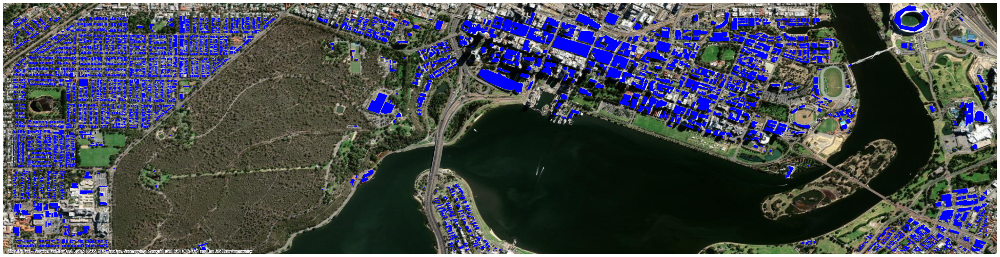

In [91]:
ax = (msb_df[['geometry']]).plot(figsize=(40, 40), color="blue")

ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

contextily.add_basemap(
    ax,     
    # source=contextily.providers.Stamen.TonerLite,     
    # source=contextily.providers.Esri.WorldStreetMap,    
    source=contextily.providers.Esri.WorldImagery,    
    crs=(msb_df[['geometry']]).crs.to_string()    
)
ax.set_axis_off()

#### Highlighting based on area

In [92]:
#Review existing DataFrame
msb_df.head()

,area_m2,geometry
0,212.547890,"POLYGON ((115.81536 -31.95147, 115.81544 -31.9..."
1,320.545779,"POLYGON ((115.81203 -31.96260, 115.81203 -31.9..."
2,10918.158928,"POLYGON ((115.89212 -31.96727, 115.89180 -31.9..."
3,323.648851,"POLYGON ((115.82223 -31.95970, 115.82231 -31.9..."
4,316.580981,"POLYGON ((115.84548 -31.95409, 115.84559 -31.9..."


In [93]:
msb_df['area_m2'].describe()

count     3858.000000
mean       690.387394
std       2070.451210
min         14.863353
25%        215.264302
50%        294.574119
75%        459.501171
max      54216.959276
Name: area_m2, dtype: float64

Add colour based on value

In [94]:
# Create a list of our conditions
conditions = [
    (msb_df['area_m2'] <= 500),
    (msb_df['area_m2'] > 500) & (msb_df['area_m2'] <= 3000),    
    (msb_df['area_m2'] > 3000)
    ]

# create a list of the values we want to assign for each condition
colour_values = ['#34ebeb', '#faf607', '#c90623']

# Create a new column and use np.select to assign values to it using our lists as arguments
msb_df['colour'] = np.select(conditions, colour_values)

In [95]:
#Display updated DataFrame
msb_df.head()

,area_m2,geometry,colour
0,212.547890,"POLYGON ((115.81536 -31.95147, 115.81544 -31.9...",#34ebeb
1,320.545779,"POLYGON ((115.81203 -31.96260, 115.81203 -31.9...",#34ebeb
2,10918.158928,"POLYGON ((115.89212 -31.96727, 115.89180 -31.9...",#c90623
3,323.648851,"POLYGON ((115.82223 -31.95970, 115.82231 -31.9...",#34ebeb
4,316.580981,"POLYGON ((115.84548 -31.95409, 115.84559 -31.9...",#34ebeb


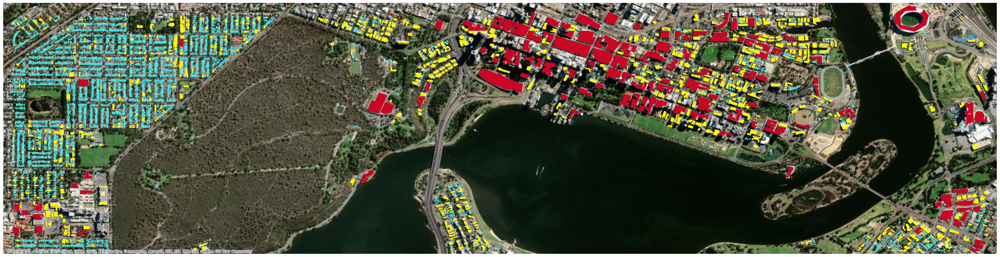

In [96]:
ax = (msb_df[['geometry']]).plot(figsize=(40, 40), color=msb_df['colour'])

ax.set_xlim(xMin, xMax)
ax.set_ylim(yMin, yMax)

contextily.add_basemap(
    ax,     
    # source=contextily.providers.Stamen.TonerLite,     
    # source=contextily.providers.Esri.WorldStreetMap,    
    source=contextily.providers.Esri.WorldImagery,    
    crs=(msb_df[['geometry']]).crs.to_string()    
)
ax.set_axis_off()

Double click image to zoom in/out.